In [2]:
import scipy.io
from scipy.io import loadmat
import pandas as pd
import numpy as np
import earthpy.plot as ep
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import spectral
from skimage.util import view_as_blocks
from sklearn.model_selection import train_test_split

In [3]:
def read_HSI_pavia():
    X = loadmat("pavia.mat")['pavia']
    y = loadmat("pavia_gt.mat")['pavia_gt']
    print(f"X pavia shape: {X.shape}\ny pavia shape: {y.shape}")
    return X, y

In [4]:
def read_HSI_indian_pines():
    X = loadmat('Indian_pines_corrected.mat')['indian_pines_corrected']
    y = loadmat('Indian_pines_gt.mat')['indian_pines_gt']
    print(f"X indian pines shape: {X.shape}\ny indian pines shape: {y.shape}")
    return X, y

In [5]:
X_pavia, y_pavia = read_HSI_pavia()

X pavia shape: (1096, 715, 102)
y pavia shape: (1096, 715)


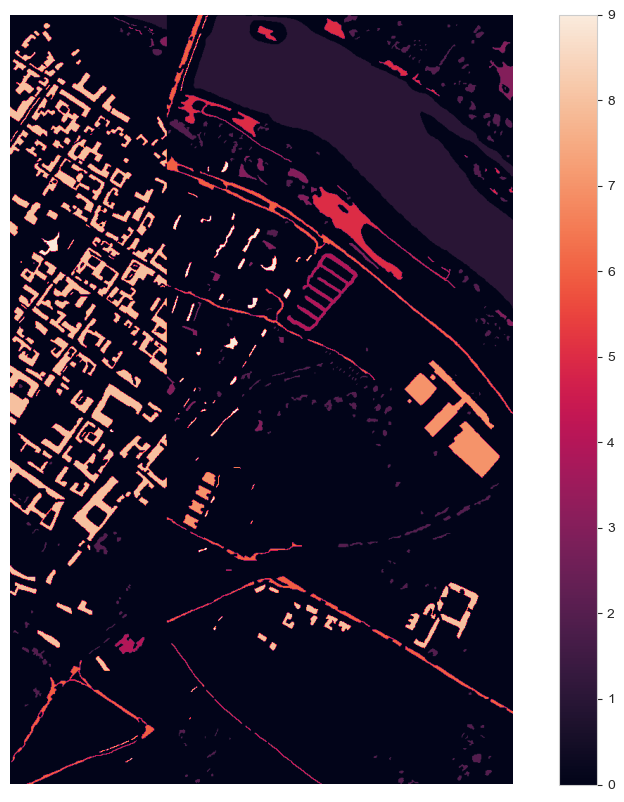

In [6]:
#plt.imshow(y_pavia,cmap='nipy_spectral')
def plot_data(data):
    fig = plt.figure(figsize=(12, 10))
    plt.imshow(data)
    plt.colorbar()
    plt.axis('off')
    plt.show()

plot_data(y_pavia)

In [7]:
X_indian_pines, y_indian_pines = read_HSI_indian_pines()

X indian pines shape: (145, 145, 200)
y indian pines shape: (145, 145)


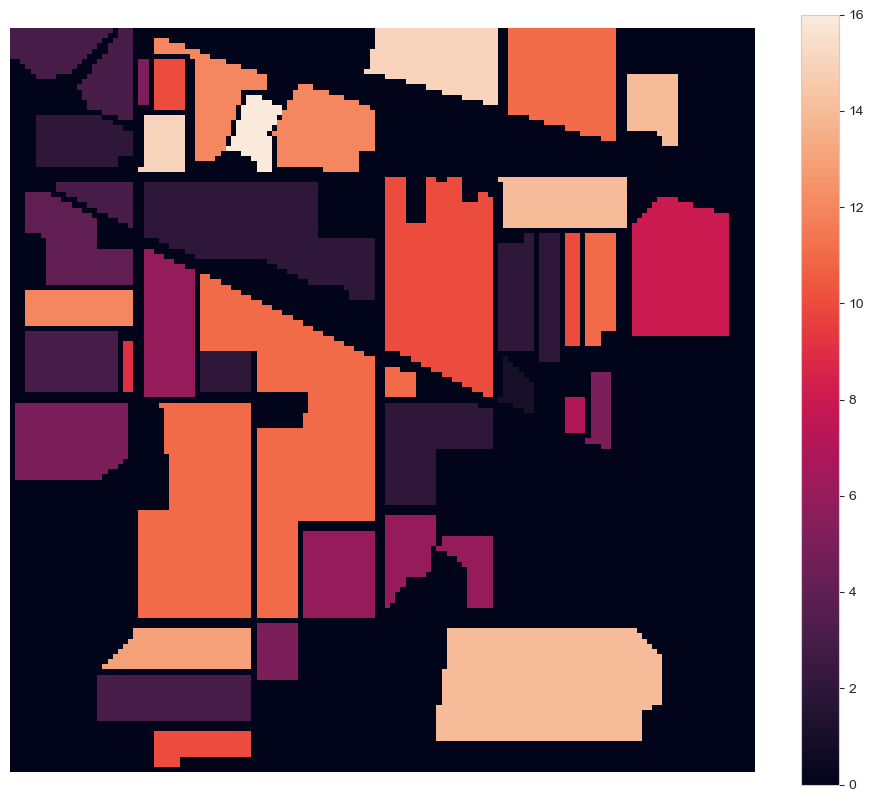

In [8]:
#plt.imshow(y_indian_pines,cmap='nipy_spectral')
plot_data(y_indian_pines)

In [9]:
def display_RGB_image(X,y, bands=(7, 5, 3)):
    # Select the specified bands for RGB channels
    rgb_image = X[:, :, bands]

    # Normalize the RGB image to the range [0, 1] for display
    rgb_image = (rgb_image - rgb_image.min()) / (rgb_image.max() - rgb_image.min())

    # Display the original image
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(rgb_image)
    plt.title('Original Image')

    # Display the ground truth
    plt.subplot(1, 2, 2)
    plt.imshow(y, cmap='viridis')  # You can choose a different colormap if needed
    plt.title('Ground Truth')

    plt.show()


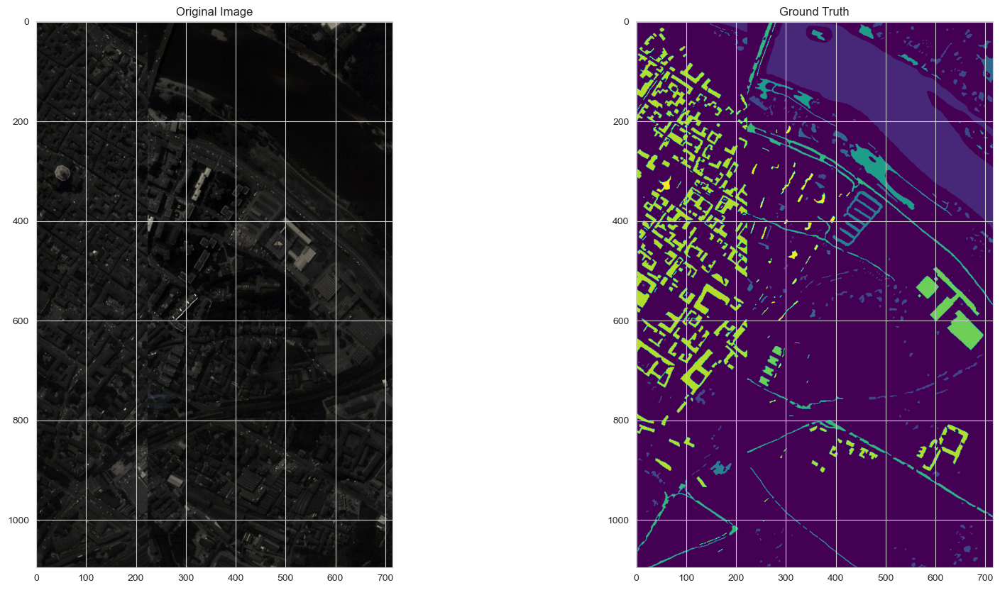

In [10]:
display_RGB_image(X_pavia,y_pavia)

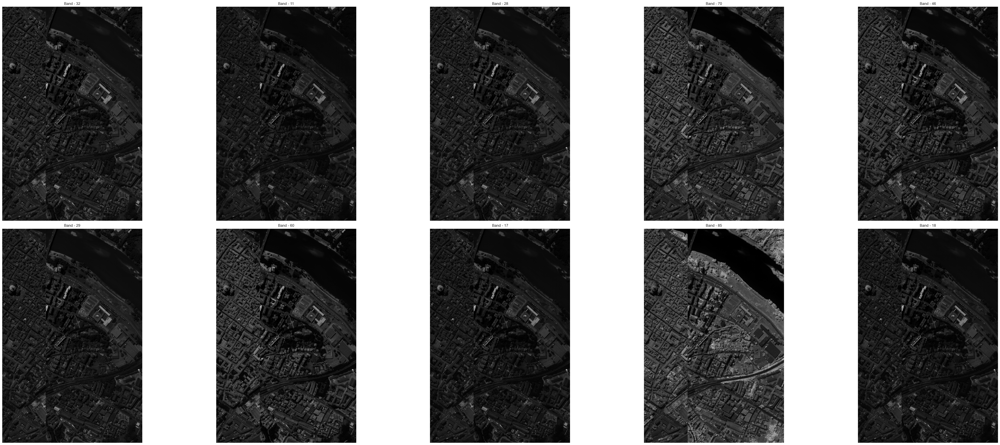

In [11]:
fig = plt.figure(figsize = (50, 20))

ax = fig.subplots(2, 5)

for i in range(2):
    for j in range(5):
        c = np.random.randint(102)
        ax[i][j].imshow(X_pavia[:, :, c],cmap="gray")
        ax[i][j].axis('off')
        ax[i][j].title.set_text(f"Band - {c}")
        c+=1

plt.tight_layout()

plt.show()

### Visualizing Spectral Signature¶
Spectral signature is the variation of reflectance or emittance of a material with respect to wavelengths (i.e., reflectance/emittance as a function of wavelength). The spectral signature of stars indicates the composition of the stellar atmosphere.

![](Sample-hyperspectral-3D-cube.jpg)

#### Band in a Image¶
Bands in images are the collection of images taken simultaneously of the same place. The coloured digital photos are made up of such multiple bands or layers.

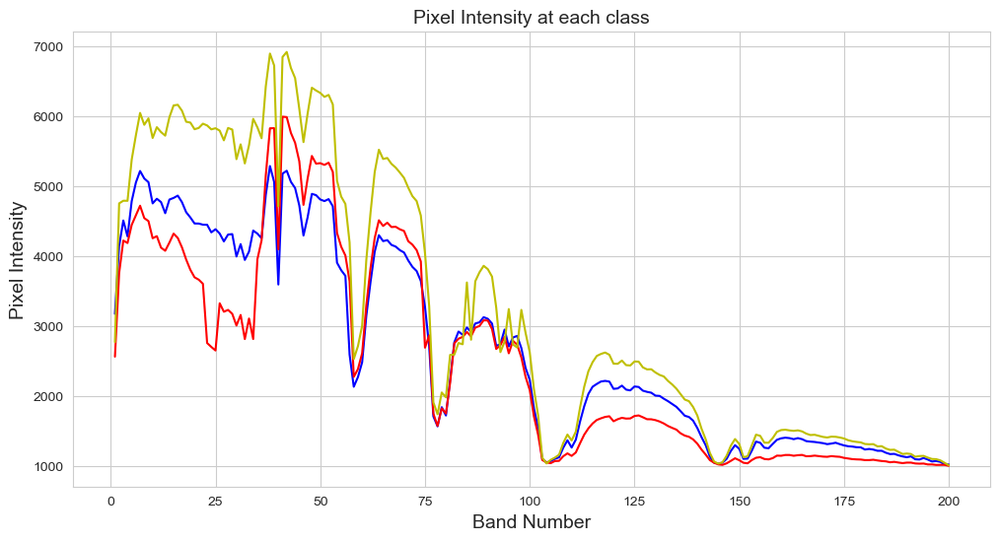

In [12]:
import matplotlib.pyplot as plt

def plot_pixel_intensity(X, ):
    plt.figure(figsize=(12, 6))
    plt.plot(range(1, 201), X[0, 0, :], 'b-',label="class 3")
    plt.plot(range(1, 201), X[10, 1, :], 'r-',label="class 15")
    plt.plot(range(1, 201), X[50, 20, :], 'y-',label="class 11")
    plt.title(f'Pixel Intensity at each class', fontsize=14)
    plt.xlabel('Band Number', fontsize=14)
    plt.ylabel('Pixel Intensity', fontsize=14)
    plt.grid(True)
    plt.show()


plot_pixel_intensity(X_indian_pines)

we can notice the similarity with the vegetation spectral signature in general
<img src="https://ltb.itc.utwente.nl/uploads/studyarea/498/Pics_2015_jpg/Fig2_13.jpg" width="800" >

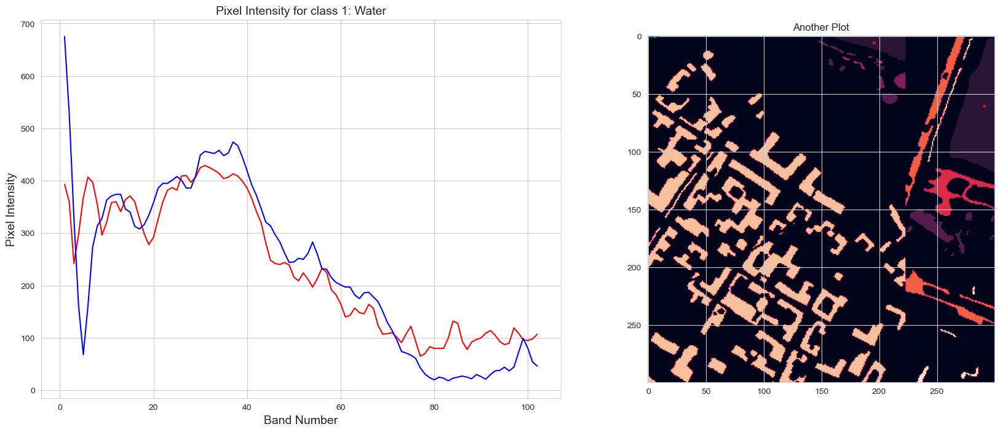

In [13]:
import matplotlib.pyplot as plt
import numpy as np

def plot_pixel_intensity(X, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 6))

    ax.plot(range(1, 103), X[5, 195, :], 'r-')
    ax.plot(range(1, 103), X[60, 290, :], 'b-')
    ax.set_title(f'Pixel Intensity for class 1: Water', fontsize=14)
    ax.set_xlabel('Band Number', fontsize=14)
    ax.set_ylabel('Pixel Intensity', fontsize=14)
    ax.grid(True)

def plot_image_with_rectangles(image, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(20, 15))

    ax.imshow(image)

    # Add rectangles
    rect1 = patches.Rectangle((195, 5), 1, 1, linewidth=2, edgecolor='r', facecolor='none')
    rect2 = patches.Rectangle((290, 60), 1, 1, linewidth=2, edgecolor='r', facecolor='none')

    ax.add_patch(rect1)
    ax.add_patch(rect2)

    if ax is None:
        plt.show()

# Create a figure and two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8), gridspec_kw={'width_ratios': [3, 2]})

# Plot the pixel intensity on the first subplot
plot_pixel_intensity(X_pavia, ax=ax1)

# Plot something else on the second subplot
ax2.plot(np.random.rand(10))
ax2.set_title('Another Plot')
cropped_image = y_pavia[0:300, 0:300]
plot_image_with_rectangles(cropped_image, ax=ax2)

# Display the plot
plt.show()


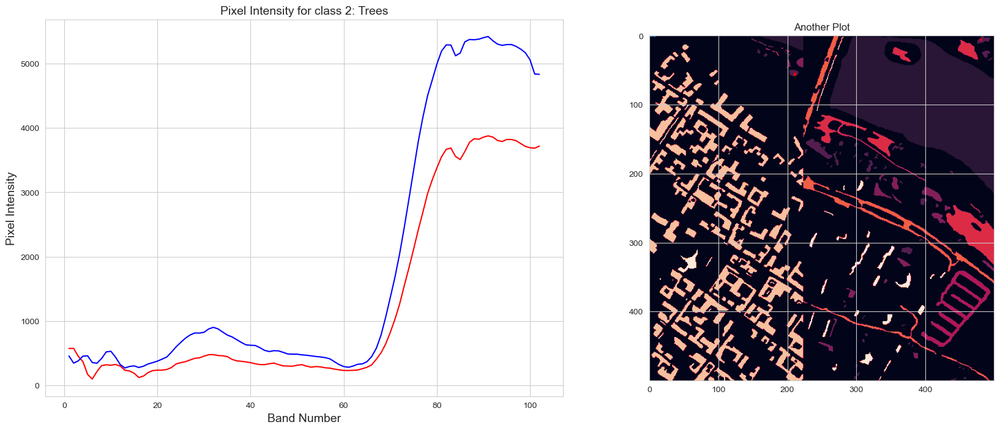

In [14]:
import matplotlib.pyplot as plt
import numpy as np

def plot_pixel_intensity(X, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 6))

    ax.plot(range(1, 103), X[5, 480, :], 'r-')
    ax.plot(range(1, 103), X[55, 210, :], 'b-')
    ax.set_title(f'Pixel Intensity for class 2: Trees', fontsize=14)
    ax.set_xlabel('Band Number', fontsize=14)
    ax.set_ylabel('Pixel Intensity', fontsize=14)
    ax.grid(True)

def plot_image_with_rectangles(image, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(20, 15))

    ax.imshow(image)

    # Add rectangles
    rect1 = patches.Rectangle((480, 5), 1, 1, linewidth=2, edgecolor='r', facecolor='none')
    rect2 = patches.Rectangle((210, 55), 1, 1, linewidth=2, edgecolor='r', facecolor='none')

    ax.add_patch(rect1)
    ax.add_patch(rect2)

    if ax is None:
        plt.show()

# Create a figure and two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8), gridspec_kw={'width_ratios': [3, 2]})

# Plot the pixel intensity on the first subplot
plot_pixel_intensity(X_pavia, ax=ax1)

# Plot something else on the second subplot
ax2.plot(np.random.rand(10))
ax2.set_title('Another Plot')
cropped_image = y_pavia[0:500, 0:500]
plot_image_with_rectangles(cropped_image, ax=ax2)

# Display the plot
plt.show()

![](https://miro.medium.com/v2/resize:fit:1400/1*MZgGPcTuTDfSdToHnNkZVg.jpeg)

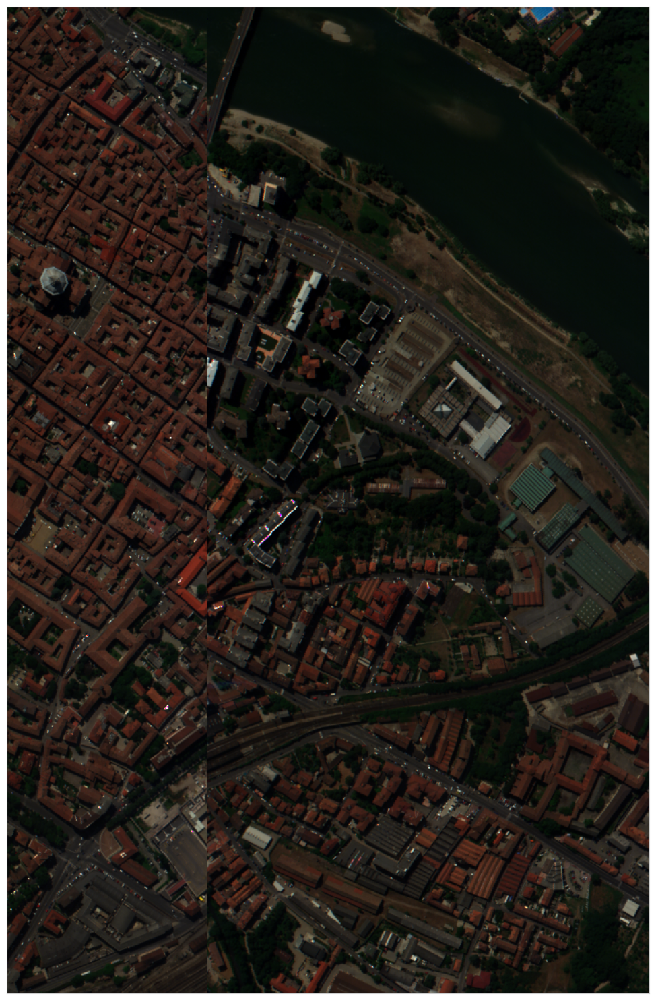

In [15]:
mdata = np.moveaxis(X_pavia, -1, 0)
#shift the bands column to the beginng to adapt to earthpy library
ep.plot_rgb(mdata, (60, 30, 10), figsize=(25, 19))

#the values 60 30 10 correspand to RGB band values
#we got these values using the spectral signature of the class trees

plt.show()

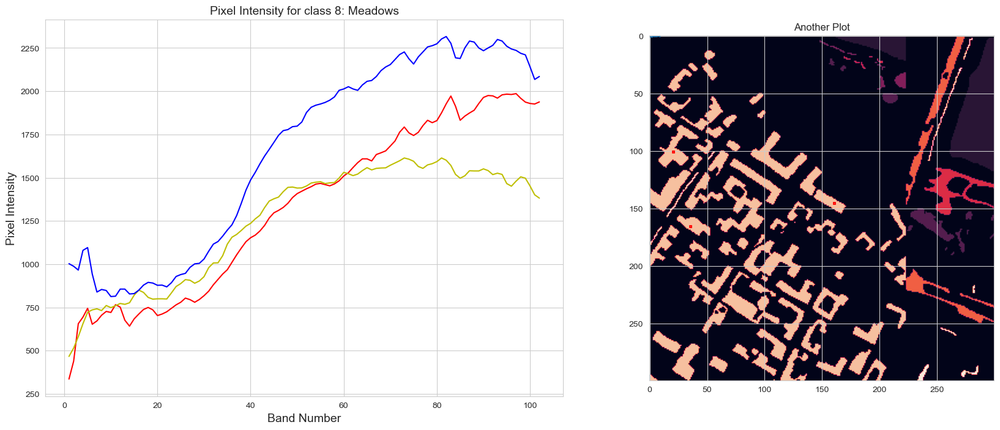

In [16]:
import matplotlib.pyplot as plt
import numpy as np

def plot_pixel_intensity(X, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 6))

    ax.plot(range(1, 103), X[100, 20, :], 'r-')
    ax.plot(range(1, 103), X[165, 35, :], 'y-')
    ax.plot(range(1, 103), X[145, 160, :], 'b-')
    ax.set_title(f'Pixel Intensity for class 8: Meadows', fontsize=14)
    ax.set_xlabel('Band Number', fontsize=14)
    ax.set_ylabel('Pixel Intensity', fontsize=14)
    ax.grid(True)

def plot_image_with_rectangles(image, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(20, 15))

    ax.imshow(image)

    # Add rectangles
    rect1 = patches.Rectangle((20, 100), 1, 1, linewidth=2, edgecolor='r', facecolor='none')
    rect2 = patches.Rectangle((35, 165), 1, 1, linewidth=2, edgecolor='r', facecolor='none')
    rect3 = patches.Rectangle((160, 145), 1, 1, linewidth=2, edgecolor='r', facecolor='none')

    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)

    if ax is None:
        plt.show()

# Create a figure and two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8), gridspec_kw={'width_ratios': [3, 2]})

# Plot the pixel intensity on the first subplot
plot_pixel_intensity(X_pavia, ax=ax1)

# Plot something else on the second subplot
ax2.plot(np.random.rand(10))
ax2.set_title('Another Plot')
cropped_image = y_pavia[0:300, 0:300]
plot_image_with_rectangles(cropped_image, ax=ax2)

# Display the plot
plt.show()


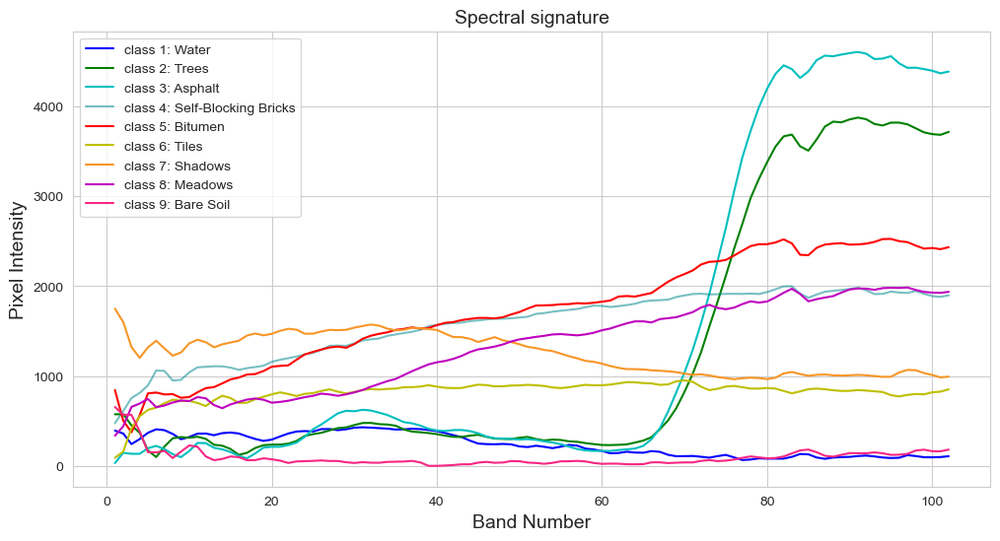

In [17]:
import matplotlib.pyplot as plt

def plot_pixel_intensity(X, ):
    plt.figure(figsize=(12, 6))

    plt.plot(range(1, 103), X[5, 195, :], 'b-', label='class 1: Water')
    plt.plot(range(1, 103), X[5, 480, :], 'g-', label='class 2: Trees')
    plt.plot(range(1, 103), X[220, 355, :], 'c-', label='class 3: Asphalt')
    plt.plot(range(1, 103), X[400, 444, :], color="#00888F88", label='class 4: Self-Blocking Bricks')
    plt.plot(range(1, 103), X[10, 452, :], 'r-', label='class 5: Bitumen')
    plt.plot(range(1, 103), X[0, 268, :], 'y-', label='class 6: Tiles')
    plt.plot(range(1, 103), X[500, 600, :], color='#f79627', label='class 7: Shadows')
    plt.plot(range(1, 103), X[100, 20, :], 'm-', label='class 8: Meadows')
    plt.plot(range(1, 103), X[325, 60, :],color='#f72782', label='class 9: Bare Soil')

    plt.title(f'Spectral signature', fontsize=14)
    plt.xlabel('Band Number', fontsize=14)
    plt.ylabel('Pixel Intensity', fontsize=14)
    plt.grid(True)
    plt.legend()
    plt.show()

plot_pixel_intensity(X_pavia)


---

In [18]:
df = pd.DataFrame(X_pavia.reshape(X_pavia.shape[0]*X_pavia.shape[1], -1))

df.columns = [f'band{i}' for i in range(1, df.shape[-1]+1)]

df['class'] = y_pavia.ravel()

In [19]:
import tensorflow as tf
X = df[df['class']!=0].iloc[:, :-1].values

y = tf.keras.utils.to_categorical(df[df['class']!=0].iloc[:, -1].values ,
                                  num_classes= np.unique(y_pavia).shape[0],
                                  dtype='float32')

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.75, stratify = y)

print(f"Train Data: {X_train.shape}\nTest Data: {X_test.shape}")


Train Data: (111114, 102)
Test Data: (37038, 102)


In [20]:

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

from tqdm import tqdm

model = Sequential(name='Pavia_University')

model.add(Input(shape = X_train[0].shape, name = 'Input_Layer'))

model.add(BatchNormalization(name = 'BatchNormalization'))

model.add(Dense(units = 128, activation= 'relu', name = 'Layer1'))
model.add(Dense(units = 128, activation= 'relu', name = 'Layer2'))
model.add(Dense(units = 128, activation= 'relu', name = 'Layer3'))
model.add(Dense(units = 128, activation= 'relu', name = 'Layer4'))

model.add(Dropout(rate = 0.2, name = 'Dropout1',))

model.add(Dense(units = 64, activation= 'relu', name = 'Layer5'))
model.add(Dense(units = 64, activation= 'relu', name = 'Layer6'))
model.add(Dense(units = 64, activation= 'relu', name = 'Layer7'))
model.add(Dense(units = 64, activation= 'relu', name = 'Layer8'))

model.add(Dropout(rate = 0.2, name = 'Dropout2'))

model.add(Dense(units = 32, activation= 'relu', name = 'Layer9'))
model.add(Dense(units = 32, activation= 'relu', name = 'Layer10'))
model.add(Dense(units = 32, activation= 'relu', name = 'Layer11'))
model.add(Dense(units = 32, activation= 'relu', name = 'Layer12'))

model.add(Dense(units = y_train.shape[1], activation= 'softmax', name = 'Output_Layer'))

model.summary()

Model: "Pavia_University"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 BatchNormalization (BatchNo  (None, 102)              408       
 rmalization)                                                    
                                                                 
 Layer1 (Dense)              (None, 128)               13184     
                                                                 
 Layer2 (Dense)              (None, 128)               16512     
                                                                 
 Layer3 (Dense)              (None, 128)               16512     
                                                                 
 Layer4 (Dense)              (None, 128)               16512     
                                                                 
 Dropout1 (Dropout)          (None, 128)               0         
                                                  

In [21]:
model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

# Callbacks
es = EarlyStopping(monitor = 'val_loss',
                   min_delta = 0,
                   patience = 15,
                   verbose = 1,
                   restore_best_weights = True)

checkpoint = ModelCheckpoint(filepath = 'Pavia_University_Model.h5',
                             monitor = 'val_loss',
                             mode ='min',
                             save_best_only = True,
                             verbose = 1)
# Fit
history = model.fit(x = X_train,
                    y = y_train,
                    validation_data = (X_test, y_test),
                    epochs = 10,
                    callbacks = [es, checkpoint])

Epoch 1/10
3470/3473 [============================>.] - ETA: 0s - loss: 0.2372 - accuracy: 0.9171
Epoch 1: val_loss improved from inf to 0.09914, saving model to Pavia_University_Model.h5
3473/3473 [==============================] - 51s 14ms/step - loss: 0.2371 - accuracy: 0.9172 - val_loss: 0.0991 - val_accuracy: 0.9664
Epoch 2/10
3472/3473 [============================>.] - ETA: 0s - loss: 0.1505 - accuracy: 0.9480
Epoch 2: val_loss improved from 0.09914 to 0.09430, saving model to Pavia_University_Model.h5
3473/3473 [==============================] - 101s 29ms/step - loss: 0.1505 - accuracy: 0.9480 - val_loss: 0.0943 - val_accuracy: 0.9617
Epoch 3/10
3473/3473 [==============================] - ETA: 0s - loss: 0.1372 - accuracy: 0.9529
Epoch 3: val_loss improved from 0.09430 to 0.07621, saving model to Pavia_University_Model.h5
3473/3473 [==============================] - 53s 15ms/step - loss: 0.1372 - accuracy: 0.9529 - val_loss: 0.0762 - val_accuracy: 0.9688
Epoch 4/10
3465/3473 [

In [22]:
import plotly.graph_objects as go

hist = pd.DataFrame(data= history.history)

fig = go.Figure()

fig.add_trace(go.Scatter(x = hist.index, y = hist.loss.values,
                         mode='lines+markers',
                         name='Train Loss'))

fig.add_trace(go.Scatter(x = hist.index, y = hist.accuracy.values,
                         mode='lines+markers',
                         name='Train Accuracy'))

fig.add_trace(go.Scatter(x = hist.index, y = hist.val_loss.values,
                         mode='lines+markers', name='Test loss'))

fig.add_trace(go.Scatter(x = hist.index, y = hist.val_accuracy.values,
                         mode='lines+markers', name='Test Accuracy'))

fig.show()

In [23]:
from sklearn.metrics import (accuracy_score,
                             confusion_matrix, classification_report)

pred = np.argmax(model.predict(X_test), axis=1)

# Classification Report
print(classification_report(pred, np.argmax(y_test, 1),
                            target_names = ['1. Water', '2. Trees', '3. Asphalt', '4. Self-Blocking Bricks',
                                            '5. Bitumen','6. Tiles', '7. Shadows',
                                            '8. Meadows', '9. Bare Soil']))

1158/1158 [==============================] - 3s 2ms/step
                         precision    recall  f1-score   support

             1. Asphalt       1.00      1.00      1.00     16492
             2. Meadows       0.94      0.97      0.96      1844
              3. Gravel       0.92      0.86      0.89       824
               4. Trees       0.22      0.51      0.31       295
5. Painted metal sheets       0.99      0.77      0.87      2130
           6. Bare Soil       0.98      0.94      0.96      2400
             7. Bitumen       0.86      0.96      0.91      1637
8. Self-Blocking Bricks       0.99      1.00      1.00     10698
             9. Shadows       1.00      1.00      1.00       718

               accuracy                           0.97     37038
              macro avg       0.88      0.89      0.88     37038
           weighted avg       0.98      0.97      0.97     37038



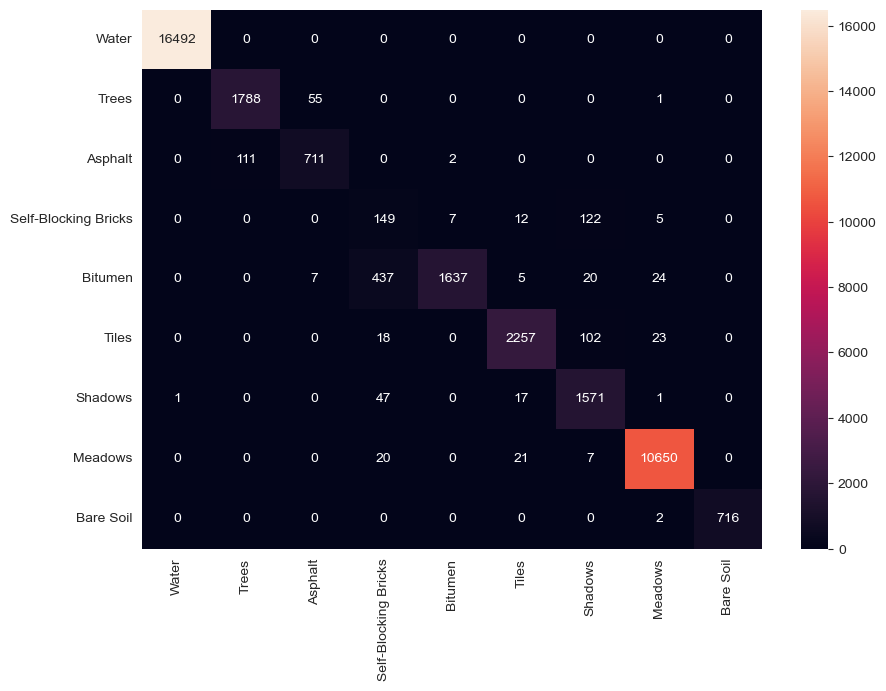

In [24]:
import seaborn as sns

plt.figure(figsize = (10,7))

classes = ['Water', 'Trees', 'Asphalt','Self-Blocking Bricks','Bitumen', 'Tiles',   'Shadows', 'Meadows','Bare Soil']

mat = confusion_matrix(np.add(pred, 1), np.add(np.argmax(y_test, 1), 1))

df_cm = pd.DataFrame(mat, index = classes, columns = classes)

sns.heatmap(df_cm, annot=True, fmt='d')

plt.show()

In [25]:
'''l = []

for i in tqdm(range(df.shape[0])):
    if df.iloc[i, -1] == 0:
        l.append(0)
    else:
        l.append(np.argmax(model.predict(df.iloc[i, :-1].values.reshape(-1, 102)), 1))

q = np.array(l).reshape(y_pavia.shape).astype('float')

plot_data(q)'''

"l = []\n\nfor i in tqdm(range(df.shape[0])):\n    if df.iloc[i, -1] == 0:\n        l.append(0)\n    else:\n        l.append(np.argmax(model.predict(df.iloc[i, :-1].values.reshape(-1, 102)), 1))\n\nq = np.array(l).reshape(y_pavia.shape).astype('float')\n\nplot_data(q)"

In [ ]:
# Define the region to crop
start_row, end_row = 0, 500  # Example start and end row for cropping
start_col, end_col = 0, 500  # Example start and end column for cropping

# Crop the image
X_cropped = X[start_row:end_row, start_col:end_col, :]

# Reshape for prediction
X_reshaped = np.reshape(X_cropped, (-1, 102))

# Make predictions
predictions = model.predict(X_reshaped)

# Create a mask for zeros in the original data
zero_mask = y_pavia[start_row:end_row, start_col:end_col] == 0

# Assign zeros where the mask is True and predicted labels where the mask is False
q_cropped = np.zeros_like(y_pavia[start_row:end_row, start_col:end_col], dtype='float')
q_cropped[~zero_mask] = np.argmax(predictions, axis=1)

# Visualize the cropped region
plot_data(q_cropped)


  0%|          | 0/1568 [00:00<?, ?it/s]

2/2 [==============================] - 0s 5ms/step


  1%|          | 9/1568 [00:01<03:07,  8.32it/s]

4/4 [==============================] - 0s 2ms/step


  1%|          | 18/1568 [00:02<03:02,  8.51it/s]

4/4 [==============================] - 0s 3ms/step


  2%|▏         | 28/1568 [00:03<02:52,  8.95it/s]

5/5 [==============================] - 0s 2ms/step


  2%|▏         | 37/1568 [00:04<02:51,  8.94it/s]

4/4 [==============================] - 0s 3ms/step


  3%|▎         | 46/1568 [00:05<02:53,  8.76it/s]

3/3 [==============================] - 0s 4ms/step


  4%|▎         | 55/1568 [00:06<02:57,  8.53it/s]

7/7 [==============================] - 0s 14ms/step


  4%|▍         | 64/1568 [00:09<04:36,  5.44it/s]

7/7 [==============================] - 0s 29ms/step


  5%|▍         | 71/1568 [00:13<07:46,  3.21it/s]

8/8 [==============================] - 0s 13ms/step


  5%|▍         | 77/1568 [00:16<08:03,  3.09it/s]

2/2 [==============================] - 0s 46ms/step


  5%|▌         | 82/1568 [00:17<07:52,  3.15it/s]

8/8 [==============================] - 0s 16ms/step


  6%|▌         | 87/1568 [00:19<07:50,  3.15it/s]

7/7 [==============================] - 0s 5ms/step


  6%|▌         | 91/1568 [00:20<07:58,  3.09it/s]

8/8 [==============================] - 0s 40ms/step


  6%|▌         | 96/1568 [00:22<07:57,  3.08it/s]

9/9 [==============================] - 0s 15ms/step


  6%|▋         | 100/1568 [00:23<08:33,  2.86it/s]

6/6 [==============================] - 0s 3ms/step


  7%|▋         | 108/1568 [00:24<06:18,  3.86it/s]

11/11 [==============================] - 1s 29ms/step


  7%|▋         | 113/1568 [00:26<06:39,  3.64it/s]

8/8 [==============================] - 0s 8ms/step


  8%|▊         | 119/1568 [00:27<06:04,  3.97it/s]

9/9 [==============================] - 0s 8ms/step


  8%|▊         | 124/1568 [00:29<06:08,  3.92it/s]

8/8 [==============================] - 0s 5ms/step


  8%|▊         | 129/1568 [00:31<07:03,  3.40it/s]

11/11 [==============================] - 0s 5ms/step


  8%|▊         | 133/1568 [00:32<07:47,  3.07it/s]

10/10 [==============================] - 0s 5ms/step


  9%|▊         | 137/1568 [00:34<08:54,  2.68it/s]

10/10 [==============================] - 0s 9ms/step


  9%|▉         | 140/1568 [00:35<08:46,  2.71it/s]

11/11 [==============================] - 0s 5ms/step


  9%|▉         | 143/1568 [00:36<08:41,  2.73it/s]

11/11 [==============================] - 1s 26ms/step


  9%|▉         | 146/1568 [00:38<09:19,  2.54it/s]

10/10 [==============================] - 0s 7ms/step


 10%|▉         | 150/1568 [00:39<08:47,  2.69it/s]

11/11 [==============================] - 0s 16ms/step


 10%|▉         | 153/1568 [00:40<08:57,  2.63it/s]

12/12 [==============================] - 0s 12ms/step


 10%|▉         | 156/1568 [00:42<09:45,  2.41it/s]

10/10 [==============================] - 0s 7ms/step


 10%|█         | 160/1568 [00:43<08:35,  2.73it/s]

10/10 [==============================] - 0s 7ms/step


 10%|█         | 163/1568 [00:44<08:35,  2.72it/s]

11/11 [==============================] - 0s 25ms/step


 11%|█         | 167/1568 [00:45<08:15,  2.83it/s]

11/11 [==============================] - 0s 7ms/step


 11%|█         | 170/1568 [00:46<08:18,  2.80it/s]

11/11 [==============================] - 0s 3ms/step


 11%|█         | 173/1568 [00:48<08:30,  2.73it/s]

11/11 [==============================] - 0s 5ms/step


 11%|█         | 176/1568 [00:49<08:18,  2.79it/s]

10/10 [==============================] - 0s 7ms/step


 11%|█▏        | 179/1568 [00:50<08:26,  2.74it/s]

11/11 [==============================] - 0s 6ms/step


 12%|█▏        | 183/1568 [00:51<07:48,  2.96it/s]

11/11 [==============================] - 0s 13ms/step


 12%|█▏        | 186/1568 [00:52<08:47,  2.62it/s]

11/11 [==============================] - 0s 9ms/step


 12%|█▏        | 189/1568 [00:54<08:39,  2.65it/s]

11/11 [==============================] - 0s 11ms/step


 12%|█▏        | 193/1568 [00:55<08:10,  2.80it/s]

9/9 [==============================] - 0s 3ms/step


 13%|█▎        | 197/1568 [00:56<07:29,  3.05it/s]

5/5 [==============================] - 0s 3ms/step


 13%|█▎        | 201/1568 [00:58<08:04,  2.82it/s]

7/7 [==============================] - 0s 14ms/step


 13%|█▎        | 204/1568 [00:59<07:59,  2.85it/s]

8/8 [==============================] - 0s 10ms/step


 13%|█▎        | 207/1568 [01:00<07:57,  2.85it/s]

10/10 [==============================] - 0s 7ms/step


 14%|█▎        | 212/1568 [01:01<07:06,  3.18it/s]

10/10 [==============================] - 0s 8ms/step


 14%|█▍        | 216/1568 [01:02<06:48,  3.31it/s]

9/9 [==============================] - 0s 8ms/step


 14%|█▍        | 220/1568 [01:04<07:27,  3.01it/s]

7/7 [==============================] - 0s 55ms/step


 14%|█▍        | 224/1568 [01:05<07:47,  2.88it/s]

8/8 [==============================] - 0s 25ms/step


 14%|█▍        | 227/1568 [01:06<08:05,  2.76it/s]

5/5 [==============================] - 0s 4ms/step


 15%|█▍        | 231/1568 [01:07<07:19,  3.04it/s]

8/8 [==============================] - 0s 3ms/step


 15%|█▍        | 235/1568 [01:09<06:59,  3.18it/s]

7/7 [==============================] - 0s 6ms/step


 15%|█▌        | 240/1568 [01:10<06:39,  3.32it/s]

3/3 [==============================] - 0s 5ms/step


 16%|█▌        | 244/1568 [01:11<06:56,  3.18it/s]

6/6 [==============================] - 0s 4ms/step


 16%|█▌        | 248/1568 [01:13<07:11,  3.06it/s]

7/7 [==============================] - 0s 13ms/step


 16%|█▌        | 252/1568 [01:14<07:08,  3.07it/s]

7/7 [==============================] - 0s 10ms/step


 16%|█▋        | 256/1568 [01:16<07:46,  2.81it/s]

6/6 [==============================] - 0s 3ms/step


 17%|█▋        | 260/1568 [01:17<07:08,  3.05it/s]

8/8 [==============================] - 0s 3ms/step


 17%|█▋        | 265/1568 [01:18<06:13,  3.49it/s]

6/6 [==============================] - 0s 7ms/step


 17%|█▋        | 270/1568 [01:19<05:39,  3.83it/s]

3/3 [==============================] - 0s 8ms/step


 17%|█▋        | 274/1568 [01:20<05:41,  3.79it/s]

7/7 [==============================] - 0s 10ms/step


 18%|█▊        | 279/1568 [01:21<05:33,  3.87it/s]

3/3 [==============================] - 0s 9ms/step


 18%|█▊        | 284/1568 [01:22<05:10,  4.13it/s]

6/6 [==============================] - 0s 11ms/step


 18%|█▊        | 289/1568 [01:24<05:38,  3.78it/s]

6/6 [==============================] - 0s 5ms/step


 19%|█▊        | 293/1568 [01:25<05:40,  3.74it/s]

3/3 [==============================] - 0s 8ms/step


 19%|█▉        | 297/1568 [01:26<06:23,  3.31it/s]

5/5 [==============================] - 0s 15ms/step


 19%|█▉        | 301/1568 [01:28<06:23,  3.31it/s]

7/7 [==============================] - 0s 10ms/step


 20%|█▉        | 306/1568 [01:29<05:46,  3.64it/s]

6/6 [==============================] - 0s 3ms/step


 20%|█▉        | 311/1568 [01:30<05:40,  3.69it/s]

8/8 [==============================] - 0s 7ms/step


 20%|██        | 315/1568 [01:31<05:51,  3.57it/s]

7/7 [==============================] - 0s 10ms/step


 20%|██        | 319/1568 [01:33<06:21,  3.28it/s]

7/7 [==============================] - 0s 24ms/step


 21%|██        | 323/1568 [01:34<06:07,  3.39it/s]

4/4 [==============================] - 0s 18ms/step


 21%|██        | 327/1568 [01:36<06:48,  3.04it/s]

7/7 [==============================] - 0s 3ms/step


 21%|██        | 331/1568 [01:37<06:21,  3.24it/s]

8/8 [==============================] - 0s 11ms/step


 21%|██▏       | 335/1568 [01:38<06:08,  3.34it/s]

5/5 [==============================] - 0s 6ms/step


 22%|██▏       | 340/1568 [01:39<05:46,  3.54it/s]

5/5 [==============================] - 0s 4ms/step


 22%|██▏       | 344/1568 [01:40<05:49,  3.50it/s]

7/7 [==============================] - 0s 10ms/step


 22%|██▏       | 348/1568 [01:41<05:36,  3.63it/s]

6/6 [==============================] - 0s 12ms/step


 22%|██▏       | 352/1568 [01:42<05:28,  3.70it/s]

6/6 [==============================] - 0s 5ms/step


 23%|██▎       | 356/1568 [01:43<05:23,  3.75it/s]

3/3 [==============================] - 0s 4ms/step


 23%|██▎       | 360/1568 [01:44<05:18,  3.79it/s]

5/5 [==============================] - 0s 3ms/step


 23%|██▎       | 364/1568 [01:46<05:57,  3.36it/s]

7/7 [==============================] - 0s 10ms/step


 23%|██▎       | 368/1568 [01:47<05:40,  3.53it/s]

6/6 [==============================] - 0s 8ms/step


 24%|██▍       | 373/1568 [01:48<05:04,  3.92it/s]

7/7 [==============================] - 0s 18ms/step


 24%|██▍       | 378/1568 [01:49<05:06,  3.89it/s]

8/8 [==============================] - 0s 17ms/step


 24%|██▍       | 382/1568 [01:50<05:14,  3.78it/s]

7/7 [==============================] - 0s 4ms/step


 25%|██▍       | 386/1568 [01:51<05:19,  3.69it/s]

9/9 [==============================] - 0s 2ms/step


 25%|██▌       | 395/1568 [01:52<03:53,  5.02it/s]

9/9 [==============================] - 0s 2ms/step


 26%|██▌       | 405/1568 [01:53<03:04,  6.32it/s]

9/9 [==============================] - 0s 2ms/step


 26%|██▋       | 415/1568 [01:54<02:38,  7.28it/s]

8/8 [==============================] - 0s 2ms/step


 27%|██▋       | 425/1568 [01:56<02:25,  7.85it/s]

7/7 [==============================] - 0s 3ms/step


 28%|██▊       | 435/1568 [01:57<02:25,  7.79it/s]

3/3 [==============================] - 0s 6ms/step


 28%|██▊       | 443/1568 [01:58<02:46,  6.78it/s]

6/6 [==============================] - 0s 8ms/step


 29%|██▉       | 451/1568 [02:00<03:20,  5.58it/s]

6/6 [==============================] - 0s 5ms/step


 29%|██▉       | 458/1568 [02:02<03:17,  5.63it/s]

6/6 [==============================] - 0s 3ms/step


 30%|██▉       | 464/1568 [02:03<03:21,  5.47it/s]

4/4 [==============================] - 0s 3ms/step


 30%|██▉       | 470/1568 [02:04<03:37,  5.06it/s]

3/3 [==============================] - 0s 4ms/step


 30%|███       | 476/1568 [02:05<03:32,  5.13it/s]

3/3 [==============================] - 0s 17ms/step


 31%|███       | 483/1568 [02:07<03:36,  5.01it/s]

4/4 [==============================] - 0s 3ms/step


 31%|███       | 489/1568 [02:08<03:31,  5.11it/s]

6/6 [==============================] - 0s 3ms/step


 32%|███▏      | 495/1568 [02:09<03:40,  4.87it/s]

4/4 [==============================] - 0s 3ms/step


 32%|███▏      | 500/1568 [02:11<03:44,  4.77it/s]

5/5 [==============================] - 0s 5ms/step


 32%|███▏      | 507/1568 [02:12<03:23,  5.21it/s]

4/4 [==============================] - 0s 4ms/step


 33%|███▎      | 513/1568 [02:13<03:35,  4.90it/s]

6/6 [==============================] - 0s 17ms/step


 33%|███▎      | 520/1568 [02:14<03:22,  5.17it/s]

4/4 [==============================] - 1s 103ms/step


 34%|███▎      | 526/1568 [02:16<03:44,  4.64it/s]

4/4 [==============================] - 0s 3ms/step


 34%|███▍      | 532/1568 [02:17<03:32,  4.87it/s]

5/5 [==============================] - 0s 6ms/step


 34%|███▍      | 538/1568 [02:18<03:45,  4.57it/s]

5/5 [==============================] - 0s 6ms/step


 35%|███▍      | 544/1568 [02:19<03:29,  4.90it/s]

3/3 [==============================] - 0s 8ms/step


 35%|███▌      | 550/1568 [02:21<03:40,  4.62it/s]

3/3 [==============================] - 0s 4ms/step


 35%|███▌      | 556/1568 [02:22<03:28,  4.85it/s]

3/3 [==============================] - 0s 4ms/step


 36%|███▌      | 562/1568 [02:23<03:22,  4.97it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▌      | 568/1568 [02:25<03:34,  4.65it/s]

3/3 [==============================] - 0s 11ms/step


 37%|███▋      | 575/1568 [02:26<03:18,  5.00it/s]

3/3 [==============================] - 0s 3ms/step


 37%|███▋      | 581/1568 [02:27<03:29,  4.71it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 586/1568 [02:28<03:25,  4.77it/s]

3/3 [==============================] - 0s 4ms/step


 38%|███▊      | 591/1568 [02:29<03:30,  4.65it/s]

2/2 [==============================] - 0s 4ms/step


 38%|███▊      | 598/1568 [02:30<03:06,  5.21it/s]

3/3 [==============================] - 0s 4ms/step


 39%|███▊      | 605/1568 [02:32<02:55,  5.50it/s]

3/3 [==============================] - 0s 5ms/step


 39%|███▉      | 611/1568 [02:33<03:03,  5.23it/s]

3/3 [==============================] - 0s 5ms/step


 39%|███▉      | 618/1568 [02:34<02:49,  5.60it/s]

3/3 [==============================] - 0s 4ms/step


 40%|███▉      | 624/1568 [02:35<02:53,  5.45it/s]

3/3 [==============================] - 0s 9ms/step


 40%|████      | 630/1568 [02:36<02:53,  5.41it/s]

3/3 [==============================] - 0s 4ms/step


 41%|████      | 636/1568 [02:37<02:54,  5.35it/s]

2/2 [==============================] - 0s 8ms/step


 41%|████      | 642/1568 [02:39<02:57,  5.21it/s]

2/2 [==============================] - 0s 37ms/step


 41%|████▏     | 648/1568 [02:40<02:56,  5.22it/s]

3/3 [==============================] - 0s 4ms/step


 42%|████▏     | 654/1568 [02:41<02:52,  5.30it/s]

3/3 [==============================] - 0s 7ms/step


 42%|████▏     | 661/1568 [02:42<02:48,  5.40it/s]

3/3 [==============================] - 0s 8ms/step


 43%|████▎     | 667/1568 [02:43<02:51,  5.26it/s]

3/3 [==============================] - 0s 3ms/step


 43%|████▎     | 674/1568 [02:44<02:38,  5.63it/s]

2/2 [==============================] - 0s 7ms/step


 43%|████▎     | 680/1568 [02:45<02:35,  5.72it/s]

2/2 [==============================] - 0s 15ms/step


 44%|████▍     | 686/1568 [02:47<02:44,  5.38it/s]

2/2 [==============================] - 0s 10ms/step


 44%|████▍     | 692/1568 [02:48<02:41,  5.41it/s]

2/2 [==============================] - 0s 4ms/step


 45%|████▍     | 698/1568 [02:49<02:50,  5.12it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▍     | 705/1568 [02:50<02:36,  5.51it/s]

3/3 [==============================] - 0s 5ms/step


 45%|████▌     | 711/1568 [02:52<02:58,  4.81it/s]

2/2 [==============================] - 0s 6ms/step


 46%|████▌     | 718/1568 [02:53<02:42,  5.22it/s]

3/3 [==============================] - 0s 4ms/step


 46%|████▌     | 724/1568 [02:54<02:56,  4.78it/s]

2/2 [==============================] - 0s 7ms/step


 46%|████▋     | 729/1568 [02:56<03:05,  4.52it/s]

2/2 [==============================] - 0s 7ms/step


 47%|████▋     | 735/1568 [02:57<02:54,  4.77it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 741/1568 [02:58<02:52,  4.79it/s]

4/4 [==============================] - 0s 3ms/step


 48%|████▊     | 747/1568 [02:59<02:45,  4.96it/s]

3/3 [==============================] - 0s 4ms/step


 48%|████▊     | 753/1568 [03:01<02:49,  4.82it/s]

2/2 [==============================] - 0s 5ms/step


 48%|████▊     | 759/1568 [03:02<02:39,  5.07it/s]

3/3 [==============================] - 0s 16ms/step


 49%|████▉     | 765/1568 [03:03<02:37,  5.10it/s]

3/3 [==============================] - 0s 4ms/step


 49%|████▉     | 771/1568 [03:04<02:29,  5.32it/s]

4/4 [==============================] - 0s 4ms/step


 50%|████▉     | 777/1568 [03:05<02:35,  5.10it/s]

5/5 [==============================] - 0s 3ms/step


 50%|█████     | 784/1568 [03:06<02:21,  5.55it/s]

5/5 [==============================] - 0s 5ms/step


 50%|█████     | 790/1568 [03:07<02:32,  5.09it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████     | 796/1568 [03:09<02:39,  4.84it/s]

4/4 [==============================] - 0s 36ms/step


 51%|█████     | 803/1568 [03:10<02:42,  4.70it/s]

2/2 [==============================] - 0s 5ms/step


 52%|█████▏    | 809/1568 [03:11<02:33,  4.95it/s]

2/2 [==============================] - 0s 5ms/step


 52%|█████▏    | 815/1568 [03:13<02:32,  4.94it/s]

3/3 [==============================] - 0s 4ms/step


 52%|█████▏    | 823/1568 [03:14<02:11,  5.67it/s]

2/2 [==============================] - 0s 6ms/step


 53%|█████▎    | 829/1568 [03:15<02:14,  5.50it/s]

2/2 [==============================] - 0s 5ms/step


 53%|█████▎    | 835/1568 [03:16<02:17,  5.33it/s]

3/3 [==============================] - 0s 51ms/step


 54%|█████▎    | 841/1568 [03:18<02:29,  4.86it/s]

3/3 [==============================] - 0s 4ms/step


 54%|█████▍    | 847/1568 [03:19<02:20,  5.13it/s]

3/3 [==============================] - 0s 12ms/step


 54%|█████▍    | 853/1568 [03:20<02:32,  4.70it/s]

2/2 [==============================] - 0s 46ms/step


 55%|█████▍    | 858/1568 [03:21<02:34,  4.61it/s]

3/3 [==============================] - 0s 3ms/step


 55%|█████▌    | 866/1568 [03:22<02:11,  5.36it/s]

2/2 [==============================] - 0s 7ms/step


 56%|█████▌    | 872/1568 [03:24<02:17,  5.06it/s]

3/3 [==============================] - 0s 3ms/step


 56%|█████▌    | 878/1568 [03:25<02:23,  4.80it/s]

5/5 [==============================] - 0s 3ms/step


 56%|█████▋    | 883/1568 [03:26<02:21,  4.83it/s]

3/3 [==============================] - 1s 53ms/step


 57%|█████▋    | 888/1568 [03:28<02:57,  3.84it/s]

3/3 [==============================] - 0s 4ms/step


 57%|█████▋    | 894/1568 [03:29<02:40,  4.21it/s]

3/3 [==============================] - 0s 21ms/step


 57%|█████▋    | 899/1568 [03:31<02:40,  4.18it/s]

3/3 [==============================] - 0s 58ms/step


 58%|█████▊    | 904/1568 [03:32<02:53,  3.82it/s]

2/2 [==============================] - 0s 8ms/step


 58%|█████▊    | 911/1568 [03:33<02:28,  4.43it/s]

3/3 [==============================] - 0s 3ms/step


 58%|█████▊    | 916/1568 [03:34<02:25,  4.47it/s]

2/2 [==============================] - 0s 16ms/step


 59%|█████▉    | 922/1568 [03:36<02:25,  4.44it/s]

3/3 [==============================] - 0s 4ms/step


 59%|█████▉    | 927/1568 [03:37<02:20,  4.57it/s]

2/2 [==============================] - 0s 39ms/step


 59%|█████▉    | 932/1568 [03:38<02:22,  4.47it/s]

2/2 [==============================] - 0s 7ms/step


 60%|█████▉    | 937/1568 [03:39<02:22,  4.43it/s]

3/3 [==============================] - 0s 3ms/step


 60%|██████    | 942/1568 [03:40<02:21,  4.41it/s]

2/2 [==============================] - 0s 4ms/step


 60%|██████    | 948/1568 [03:41<02:08,  4.81it/s]

3/3 [==============================] - 0s 4ms/step


 61%|██████    | 953/1568 [03:42<02:10,  4.70it/s]

3/3 [==============================] - 0s 7ms/step


 61%|██████    | 959/1568 [03:43<02:01,  5.01it/s]

2/2 [==============================] - 0s 4ms/step


 62%|██████▏   | 965/1568 [03:45<02:00,  4.99it/s]

1/1 [==============================] - 0s 57ms/step


 62%|██████▏   | 971/1568 [03:46<02:09,  4.60it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 978/1568 [03:47<01:54,  5.17it/s]

3/3 [==============================] - 0s 3ms/step


 63%|██████▎   | 986/1568 [03:48<01:39,  5.86it/s]

3/3 [==============================] - 0s 4ms/step


 64%|██████▎   | 996/1568 [03:49<01:21,  6.98it/s]

3/3 [==============================] - 0s 3ms/step


 64%|██████▍   | 1007/1568 [03:50<01:09,  8.08it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▍   | 1018/1568 [03:51<01:03,  8.72it/s]

2/2 [==============================] - 0s 3ms/step


 66%|██████▌   | 1029/1568 [03:52<00:58,  9.15it/s]

2/2 [==============================] - 0s 4ms/step


 66%|██████▋   | 1040/1568 [03:54<00:56,  9.42it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 1051/1568 [03:55<00:53,  9.73it/s]

1/1 [==============================] - 0s 46ms/step


 68%|██████▊   | 1062/1568 [03:56<00:51,  9.82it/s]

1/1 [==============================] - 0s 75ms/step


 68%|██████▊   | 1072/1568 [03:58<01:04,  7.70it/s]

2/2 [==============================] - 0s 15ms/step


 69%|██████▉   | 1081/1568 [04:00<01:26,  5.66it/s]

1/1 [==============================] - 0s 53ms/step


 69%|██████▉   | 1088/1568 [04:02<01:27,  5.50it/s]

1/1 [==============================] - 0s 66ms/step


 70%|██████▉   | 1096/1568 [04:03<01:20,  5.88it/s]

1/1 [==============================] - 0s 51ms/step


 70%|███████   | 1104/1568 [04:04<01:14,  6.27it/s]

1/1 [==============================] - 0s 46ms/step


 71%|███████   | 1112/1568 [04:05<01:08,  6.61it/s]

1/1 [==============================] - 0s 56ms/step


 72%|███████▏  | 1122/1568 [04:06<01:01,  7.27it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 1132/1568 [04:07<00:54,  7.94it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 1145/1568 [04:08<00:46,  9.12it/s]

2/2 [==============================] - 0s 5ms/step


 74%|███████▎  | 1155/1568 [04:10<00:47,  8.66it/s]

2/2 [==============================] - 0s 5ms/step


 74%|███████▍  | 1165/1568 [04:11<00:45,  8.91it/s]

2/2 [==============================] - 0s 3ms/step


 75%|███████▌  | 1176/1568 [04:12<00:42,  9.33it/s]

2/2 [==============================] - 0s 4ms/step


 76%|███████▌  | 1187/1568 [04:13<00:39,  9.72it/s]

2/2 [==============================] - 0s 3ms/step


 76%|███████▋  | 1199/1568 [04:14<00:36, 10.18it/s]

2/2 [==============================] - 0s 3ms/step


 77%|███████▋  | 1211/1568 [04:15<00:33, 10.51it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 1222/1568 [04:16<00:34, 10.07it/s]

3/3 [==============================] - 0s 4ms/step


 79%|███████▊  | 1233/1568 [04:17<00:35,  9.46it/s]

3/3 [==============================] - 0s 2ms/step


 79%|███████▉  | 1243/1568 [04:18<00:35,  9.12it/s]

2/2 [==============================] - 0s 3ms/step


 80%|███████▉  | 1254/1568 [04:20<00:33,  9.42it/s]

2/2 [==============================] - 0s 3ms/step


 81%|████████  | 1266/1568 [04:21<00:30,  9.96it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████▏ | 1277/1568 [04:22<00:29,  9.73it/s]

2/2 [==============================] - 0s 6ms/step


 82%|████████▏ | 1288/1568 [04:23<00:28,  9.88it/s]

2/2 [==============================] - 0s 7ms/step


 83%|████████▎ | 1298/1568 [04:24<00:27,  9.69it/s]

1/1 [==============================] - 0s 50ms/step


 83%|████████▎ | 1308/1568 [04:25<00:28,  9.11it/s]

1/1 [==============================] - 0s 48ms/step


 84%|████████▍ | 1318/1568 [04:27<00:28,  8.65it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▍ | 1328/1568 [04:28<00:26,  8.93it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 1340/1568 [04:29<00:23,  9.62it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 1351/1568 [04:30<00:22,  9.83it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 1361/1568 [04:31<00:21,  9.45it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 1373/1568 [04:32<00:19, 10.01it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 1385/1568 [04:33<00:17, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 1397/1568 [04:34<00:15, 10.80it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 1409/1568 [04:35<00:14, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 1420/1568 [04:36<00:13, 10.72it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 1432/1568 [04:37<00:12, 10.83it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 1443/1568 [04:38<00:11, 10.48it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 1454/1568 [04:39<00:10, 10.57it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 1465/1568 [04:40<00:09, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 1476/1568 [04:41<00:08, 10.62it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 1488/1568 [04:43<00:07, 10.74it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 1499/1568 [04:44<00:06, 10.36it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▋| 1510/1568 [04:45<00:05, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 1522/1568 [04:46<00:04, 10.47it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 1534/1568 [04:47<00:03, 10.76it/s]

1/1 [==============================] - 0s 70ms/step


 99%|█████████▊| 1545/1568 [04:48<00:02, 10.51it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 1556/1568 [04:49<00:01, 10.47it/s]

1/1 [==============================] - 0s 32ms/step


100%|██████████| 1568/1568 [04:50<00:00,  5.40it/s]


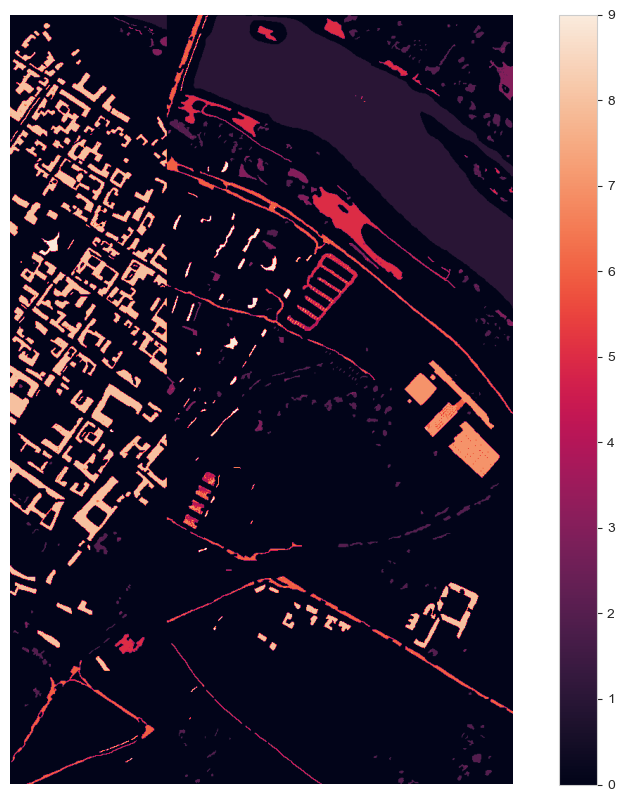

In [26]:
import numpy as np
import pandas as pd
from tqdm import tqdm

batch_size = 500  # Adjust this size according to your system's capability

def process_in_batches(dataframe, model):
    num_batches = (len(dataframe) + batch_size - 1) // batch_size  # Calculate the number of batches needed
    results = []

    for batch in tqdm(range(num_batches), mininterval=1):  # Set mininterval to 1 second
        start_idx = batch * batch_size
        end_idx = min(start_idx + batch_size, len(dataframe))
        batch_data = dataframe.iloc[start_idx:end_idx]

        # Check the condition in the last column
        mask = batch_data.iloc[:, -1] == 0
        predictions = np.zeros((len(batch_data),))  # Default to zeros

        # Only predict where the mask is False
        if not mask.all():
            predict_cols = batch_data.columns[:-1].tolist()  # Get all columns except the last one
            predict_rows = batch_data.loc[~mask, predict_cols].values
            predict_rows = np.reshape(predict_rows, (-1, 102))  # Reshape to correct shape
            predictions[~mask] = np.argmax(model.predict(predict_rows), axis=1)

        results.extend(predictions)

    return np.array(results)

# Apply the batch processing function
results_array = process_in_batches(df, model)

# Assuming y_pavia.shape is the target shape for final results
results_reshaped = results_array.reshape(y_pavia.shape).astype('float')

# Assuming plot_data is a function to visualize the results
plot_data(results_reshaped)


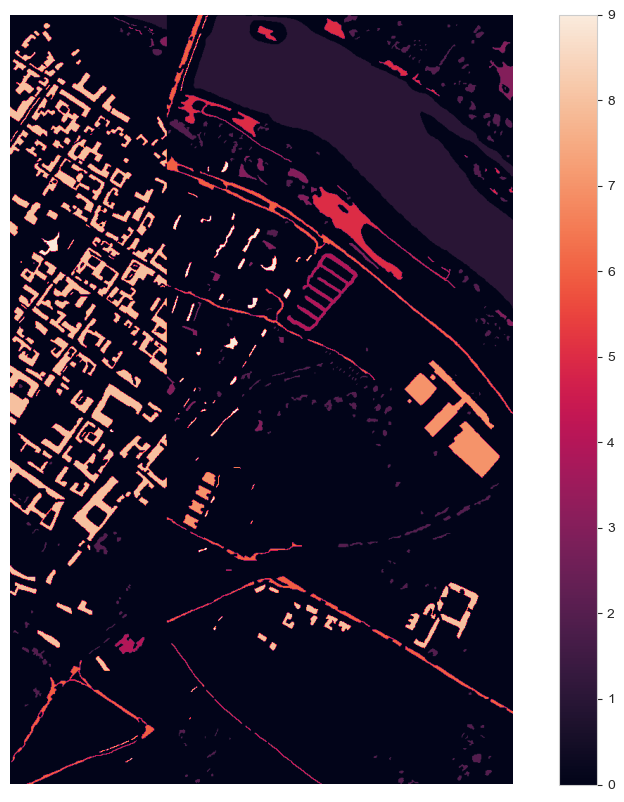

In [27]:
plot_data(y_pavia)